In [1]:
import tensorflow as tf
#tf.enable_eager_execution()
import matplotlib.pyplot as plt
import numpy as np
import cv2
# USED MODEL
from tensorflow.keras.applications import vgg19

In [2]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [3]:
# zaczniemy od przekopiowania stylu dwurnika na zdjęcie takie samo jak jego obraz 
style_image_1_dir = './obrazy/Pejzaze/starry_night.jpg'
style_image_2_dir = './obrazy/Pejzaze/starry_night.jpg'
style_image_3_dir = './obrazy/Pejzaze/starry_night.jpg'
style_image_4_dir = './obrazy/Pejzaze/starry_night.jpg'
style_image_5_dir = './obrazy/Pejzaze/starry_night.jpg'

content_image_dir = './obrazy/Portrety/Olga_Bogacz.jpg'

In [4]:
# funkcje obsługujące obrazy wynikiem jest tablica np.array
def load_image(location):
    image = cv2.imread(location)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return np.array(image)

        
# funkcja wyświetlająco obrazy w rzędzie, można podac listę obrazów do wyświetlenia 
def plot_images(images, num_rows = 1):
    n = len(images)
    num_cols = np.ceil(n/num_rows)
    fig,axes = plt.subplots(ncols = int(num_cols),nrows = int(num_rows))
    axes = axes.flatten()
    fig.set_size_inches((15,15))
    for i,image in enumerate(images):
        axes[i].imshow(image)

(833, 1000, 3)
(833, 1000, 3)
(833, 1000, 3)
(833, 1000, 3)
(833, 1000, 3)
(1210, 1172, 3)


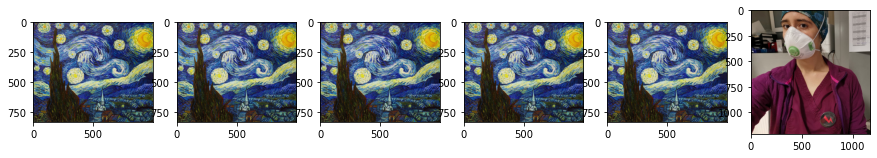

In [5]:
# load and disply images 
style_image_1 = load_image(style_image_1_dir)
style_image_2 = load_image(style_image_2_dir)
style_image_3 = load_image(style_image_3_dir)
style_image_4 = load_image(style_image_4_dir)
style_image_5 = load_image(style_image_5_dir)

content_image = load_image(content_image_dir)

print(style_image_1.shape)
print(style_image_2.shape)
print(style_image_3.shape)
print(style_image_4.shape)
print(style_image_5.shape)

print(content_image.shape)


plot_images([style_image_1, style_image_2, style_image_3, style_image_4, style_image_5, content_image])

(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)


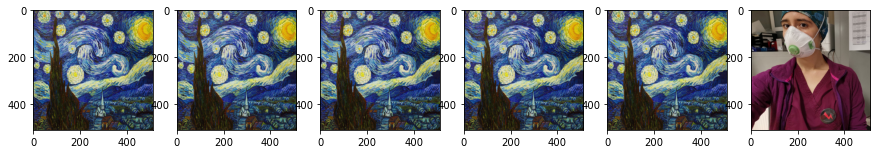

In [6]:
# obcięcie rozmiaru zdjęć do kwadratu i zmniejszenie
style_image_1 = cv2.resize(style_image_1, (512,512), interpolation = cv2.INTER_AREA)
style_image_2 = cv2.resize(style_image_2, (512,512), interpolation = cv2.INTER_AREA)
style_image_3 = cv2.resize(style_image_3, (512,512), interpolation = cv2.INTER_AREA)
style_image_4 = cv2.resize(style_image_4, (512,512), interpolation = cv2.INTER_AREA)
style_image_5 = cv2.resize(style_image_5, (512,512), interpolation = cv2.INTER_AREA)

content_image = cv2.resize(content_image, (512, 512), interpolation = cv2.INTER_AREA)
                                      
print(style_image_1.shape)
print(style_image_2.shape)
print(style_image_3.shape)
print(style_image_4.shape)
print(style_image_5.shape)

print(content_image.shape)

plot_images([style_image_1, style_image_2, style_image_3, style_image_4, style_image_5, content_image])

In [7]:
# import i uruchomienie modelu 
base_model = vgg19.VGG19(include_top=False, weights='imagenet')
print(base_model.summary())

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

#### Sprawdzenie jak będzie wyglądał przetworzony obraz

In [8]:
# dwa obrzy są używane, jeden to style [obraz artysty], a drugi to content [przetwarzane zdjęcie]
style_image = style_image_1
content_image = content_image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 512, 512, 3)
(512, 512, 3)
<class 'numpy.ndarray'>


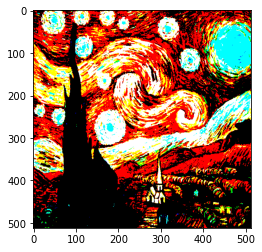

In [9]:
# sprawdzenie przetwarzania któe wykonuje sieć
process_example_img = vgg19.preprocess_input(np.expand_dims(style_image, axis=0))
print(process_example_img.shape)
print(process_example_img[0].shape)
print(type(process_example_img))

plt.imshow(process_example_img[0])

# jest ok, dodaliśmy jeden wymiar do obrazu, sztucznie bo sieć wymaga dodatkowych wejść, 
# widać jednak, że zmieniły się bardzo kolory, i taki zmienionybędzie obraz wyjściowy, 
# po pierwsze mamy zastosowane do kanałów koloru biasy, dodatkowo, zmieniana jest RGB na BGR
# od razu warto dopisać funkcję odwracającą zmiany kolorów

In [10]:
# sprawdzenie wartości biasów
VGG_BIASES = vgg19.preprocess_input((np.zeros((3))).astype("float32"))
# funkcja deprocessu
def deprocess (start_image):
    fin_image = start_image - VGG_BIASES
    fin_image = tf.unstack(fin_image,axis=-1)
    fin_image = tf.stack([fin_image[2],fin_image[1],fin_image[0]],axis=-1)
    return fin_image

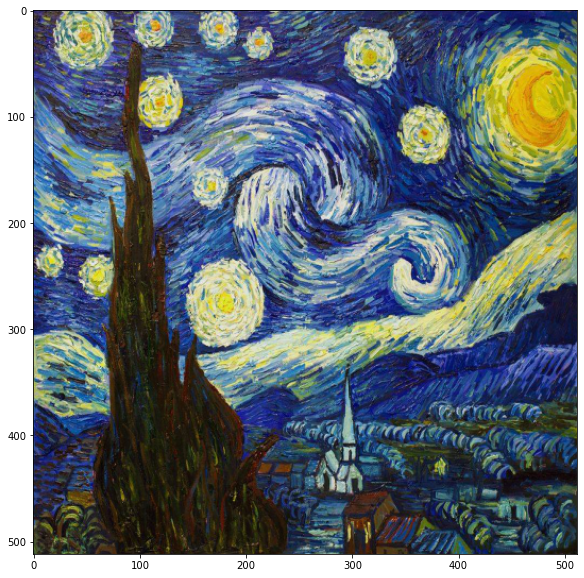

In [11]:
# sprawdzenie działania funkcji odwracającej działanie sieci na obrazie wyjściowym
plt.figure(figsize=(10,10))
plt.imshow(deprocess(process_example_img[0])/255)

### Tworzenie modelu to pobrania stylu 
W modelu style transfer po wstepnym nauczeniu sieci stosujemy sieć i jej części gdzie zapisane są cechy główne do zmiany obrau wejściowego. Ta operacja powtarza się wielokrotnie.

In [12]:
CONTENT_LAYERS = ["block5_conv2"] # przykładowa warstwa z której pobierzemy kontent po jednym obrocie
STYLE_LAYERS = ["block4_conv1",
                "block4_conv2",
                "block4_conv3",
                "block4_conv4"] # te warstwy zawierają cechy stylu

In [13]:
# zdefiniowanie modeli do testów, pełnego VGG19, bez pierwszych warstw i dla różnych rozmiarów
def make_model(full=False, in_shape=None):
    if full:    
        base_model = vgg19.VGG19(inclued_top=True, weights='imegenet')
        return base_model
    if in_shape != None:
        base_model = vgg19.VGG19(inclued_top=False, input_shape=in_shape, weights='imegenet')
    else:
        base_model=vgg19.VGG19(include_top=False,weights="imagenet")
    # w metodzie style transfer, optymalizację nie wykonujemy na modelu, ale na obrazie transformowanym 
    base_model.trainable = False
    content_layers = CONTENT_LAYERS
    style_layers = STYLE_LAYERS
    output_layers = [base_model.get_layer(layer).output for layer in (content_layers+style_layers)]
    return tf.keras.models.Model(base_model.input,output_layers)

In [14]:
# stworzenie modelu 
base_model = make_model()

In [15]:
# aby użyć przerobionego modelu VGG19 należy na wejścia podać przeprocesowane obrazy 
processed_style_img_1 = vgg19.preprocess_input(np.expand_dims(style_image_1, axis = 0))
processed_style_img_2 = vgg19.preprocess_input(np.expand_dims(style_image_2, axis = 0))
processed_style_img_3 = vgg19.preprocess_input(np.expand_dims(style_image_3, axis = 0))
processed_style_img_4 = vgg19.preprocess_input(np.expand_dims(style_image_4, axis = 0))
processed_style_img_5 = vgg19.preprocess_input(np.expand_dims(style_image_5, axis = 0))

processed_content_img = vgg19.preprocess_input(np.expand_dims(content_image, axis = 0))

In [16]:
# otrzymanie pierwszych danych wyjściowych
outputs_style_img_1 = base_model(processed_style_img_1)
outputs_style_img_2 = base_model(processed_style_img_2)
outputs_style_img_3 = base_model(processed_style_img_3)
outputs_style_img_4 = base_model(processed_style_img_4)
outputs_style_img_5 = base_model(processed_style_img_5)

outputs_content_img = base_model(processed_content_img)

In [17]:
# wyciągnięcie odpowiednichcech stylu z obrazów
fetures_style_img_1 = outputs_style_img_1[0]
fetures_style_img_2 = outputs_style_img_2[0]
fetures_style_img_3 = outputs_style_img_3[0]
fetures_style_img_4 = outputs_style_img_4[0]
fetures_style_img_5 = outputs_style_img_5[0]

fetures_content_img = outputs_content_img[0]

#### Teraz nalezy zbudować odpowiednią funkcję porównania stylu i kontentu 
użyta zostanie tutaj macierz Gramma do różnicy styli obu obrazów oraz zwykła MSE do różnicy kontentów
MSE ma posłużyć zachowaniu oryginalnego wyglądu kontentu (np. pies ma zostać psem, ale o zmienionym stylu)

In [18]:
# funkcja straty kontentu między dwoma obrazami MSE
def content_loss(img_new, img_base):
    return np.mean(np.square(img_new - img_base))

In [19]:
# funkcja straty stylu, implementację wziąłem z internetu
# w skrócie macierz Gramma to macierz wszystkich możliwych relacji między cechami obrazu
def gram_matrix(output):
    first_style_layer = output
    A = tf.reshape(first_style_layer,(-1,first_style_layer.shape[-1]))
    n = A.shape[0]
    gram_matrix = tf.matmul(A,A,transpose_a = True)
    n = gram_matrix.shape[0]
    return gram_matrix/tf.cast(n,"float32"),n

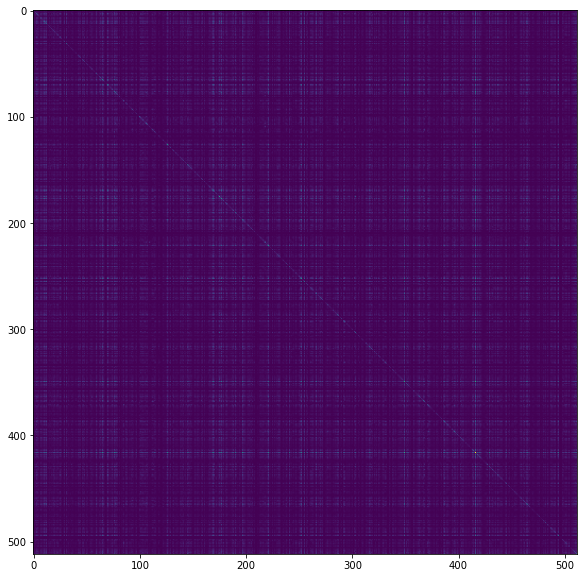

In [20]:
# Macierz dla warstw styli które wyciągnęliśmy z obrazu stylu
gram_matrix_img, N = gram_matrix(outputs_style_img_1[2])

plt.figure(figsize=(10,10))
plt.imshow(gram_matrix_img.numpy())

In [21]:
def style_loss(style_new, style_base):
    style_new_gram, gram_height1 = gram_matrix(style_new)
    style_base_gram, gram_height2 = gram_matrix(style_base)
    assert gram_height1 == gram_height2
    num_features = style_new_gram.shape[0]
    loss = tf.reduce_sum(tf.square(style_base_gram-style_new_gram)/(4*int(gram_height1)**2)*(int(num_features)**2))
    return loss
    

In [22]:
# połącznie błędu kontentu i stylu 
# współczynnik pozwoli na dopasowanie stosunku wagi stylu do zachowania kontentu
def total_loss(new_image_output,base_content_image_output,base_style_image_output,alpha=.999):
    new_image_styles = new_image_output[len(CONTENT_LAYERS):]
    base_image_styles = base_style_image_output[len(CONTENT_LAYERS):]
    style_loss_val = 0
    N = len(new_image_styles)
    for i in range(N):
        style_loss_val += style_loss(new_image_styles[i], base_image_styles[i])   
    
    new_image_contents = new_image_output[:len(CONTENT_LAYERS)]
    base_image_contents = base_content_image_output[:len(CONTENT_LAYERS)]
    content_loss_val = 0
    N = len(new_image_contents)
    for i in range(N):
        content_loss_val += content_loss(new_image_contents[i],base_image_contents[i])/N
    
    return (1-alpha)*style_loss_val+alpha*content_loss_val

In [23]:
# strata przetworzenia pierwszej rotacji 
total_loss(outputs_style_img_1, outputs_content_img, outputs_style_img_1)

<tf.Tensor: shape=(), dtype=float32, numpy=4737.05>

### Training
Po przygotowaniu wszystkich elementów można uruchomić procedurę przetwarzania obrazu 

In [24]:
base_style_outputs_1 = base_model(processed_style_img_1)
base_style_outputs_2 = base_model(processed_style_img_2)
base_style_outputs_3 = base_model(processed_style_img_3)
base_style_outputs_4 = base_model(processed_style_img_4)
base_style_outputs_5 = base_model(processed_style_img_5)

base_content_outputs = base_model(processed_content_img)

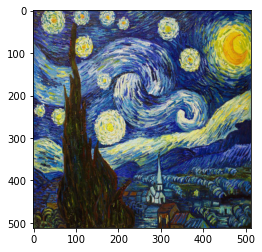

In [25]:
plt.imshow(deprocess(processed_style_img_1[0])/255)

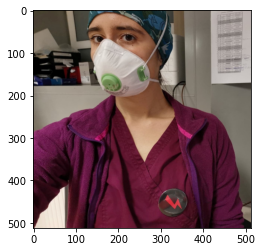

In [26]:
plt.imshow(deprocess(processed_content_img[0])/255)

In [27]:
# !!!! Można spróbować dodać trochę szumu do tego, żeby obraz lepiej poddał się content loss !!!!!
# +tf.random.normal(processed_real_img.shape)
processed_content_var = tf.Variable(processed_content_img+tf.random.normal(processed_content_img.shape))

In [28]:
optimizer = tf.keras.optimizers.Adam(5, beta_1=.99, epsilon=1e-3)

In [29]:
from IPython.display import display,clear_output

In [30]:
images = []
losses = []
i = 0 
# na początek coś dużego, tak o dla ogarnięcia jak to wyjdzie
best_loss = 200000
min_vals = VGG_BIASES
max_vals = VGG_BIASES + 255

for i in range(10000):
    with tf.GradientTape() as tape:
        # wybranie jednego z 5 zdjęć
        if i%5 == 0:
            base_style_outputs = base_style_outputs_1
        elif i%5 == 1:
            base_style_outputs = base_style_outputs_2
        elif i%5 == 2:
            base_style_outputs = base_style_outputs_3
        elif i%5 == 3:
            base_style_outputs = base_style_outputs_4
        elif i%5 == 4:
            base_style_outputs = base_style_outputs_5
        
        tape.watch(processed_content_var)
        content_var_outputs = base_model(processed_content_var)
        loss = total_loss(content_var_outputs,base_content_outputs,base_style_outputs,alpha=.97)
        grad = tape.gradient(loss,processed_content_var)
        losses.append(loss)
        optimizer.apply_gradients(zip([grad],[processed_content_var]))
        # obcinamy do wartości dopuszczalnych, po deprocessingu muszą być rozpownawalne
        clipped = tf.clip_by_value(processed_content_var, min_vals, max_vals)
        processed_content_var.assign(clipped)       
        if i%9 == 0:
            images.append(deprocess(processed_content_var))
        if loss < best_loss:
            # nadajemy nowy loss jako best i przypisujemy best_img
            best_image = processed_content_var
            best_loss=loss    
        clear_output(wait=True)
        print(loss)
        print(i)

tf.Tensor(2544301500000.0, shape=(), dtype=float32)
9999


In [31]:
len(images)

1112

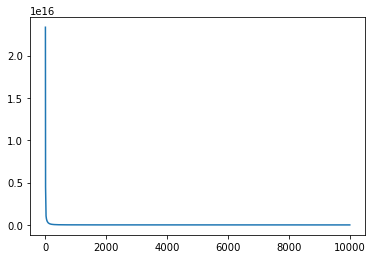

In [32]:
plt.plot(losses)

In [33]:
 #images[:][0].shape

In [34]:
# frame = (images[0][0]/255).numpy()
# cv2.imshow('video',frame)
# height, width, channels = frame.shape

# fourcc = cv2.VideoWriter_fourcc(*'mp4v') # Be sure to use lower case
# out = cv2.VideoWriter('./GIFY/Pomarancze_Michal_3', fourcc, 20.0, (width, height))

# for image in images[:][0]:
#     print(image.shape)
#     image = image.numpy().reshape((600, 500, 3))
#     out.write(image) # Write out frame to video

    
# out.release()
# cv2.destroyAllWindows()


In [35]:
# from matplotlib.animation import FuncAnimation

In [36]:
# fig, ax = plt.subplots(ncols = 3,nrows = 1,figsize=(40, 20))
# def update(i):
#     im_normed = images[i].numpy().reshape((900, 700, 3))/255
#     ax[0].imshow(im_normed)
#     ax[1].imshow(plac_zbawiciela_real_img)
#     ax[2].imshow(plac_zbawiciela_dwur_img)
#     ax[0].set_title("Loss: {:.4e}, {}".format(losses[i], i), fontsize=20)
#     ax[0].set_axis_off()
#     ax[1].set_axis_off()
#     ax[2].set_axis_off()
#     print(i)
# anim = FuncAnimation(fig, update, frames=np.arange(0, len(images)), interval=100)
# anim.save('./GIFY/Pomarancze_Michal.gif', dpi=80, writer='ffmpeg')
# plt.close()

<Figure size 2160x2160 with 0 Axes>

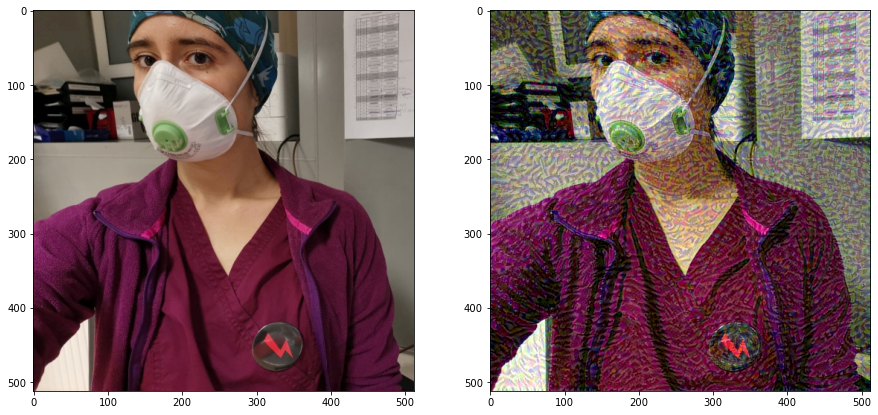

In [37]:
image_deproc = images[1][0]

plt.figure(figsize=(30,30))
plot_images([content_image,image_deproc/255])

<Figure size 2160x2160 with 0 Axes>

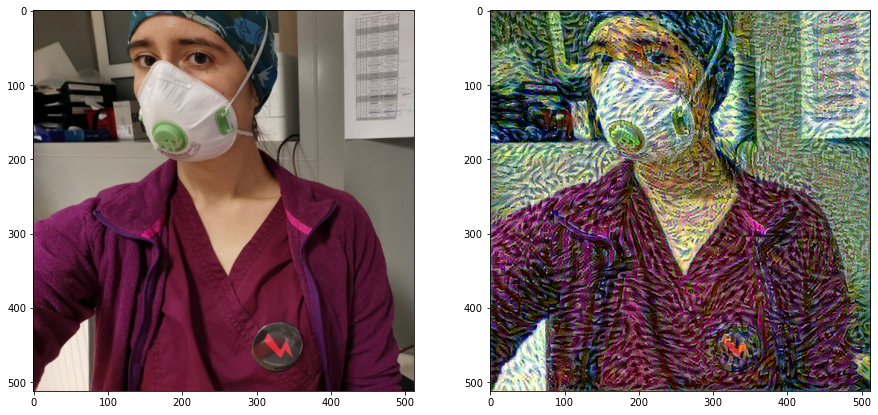

In [38]:
image_deproc = images[5][0]

plt.figure(figsize=(30,30))
plot_images([content_image,image_deproc/255])

<Figure size 2160x2160 with 0 Axes>

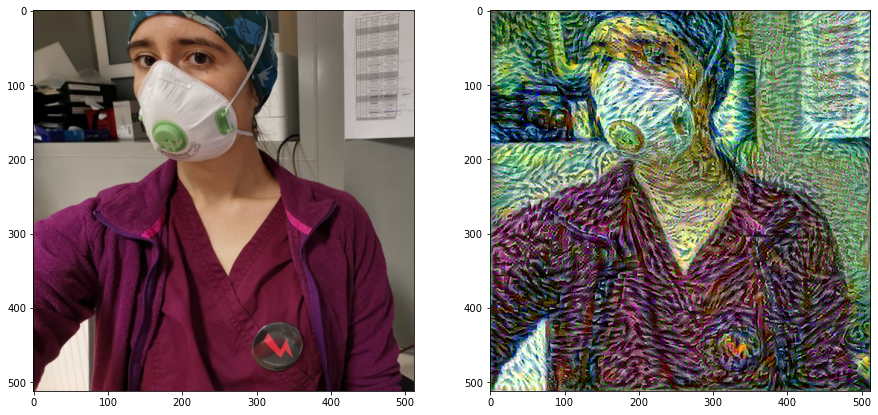

In [39]:
image_deproc = images[10][0]

plt.figure(figsize=(30,30))
plot_images([content_image,image_deproc/255])

<Figure size 2160x2160 with 0 Axes>

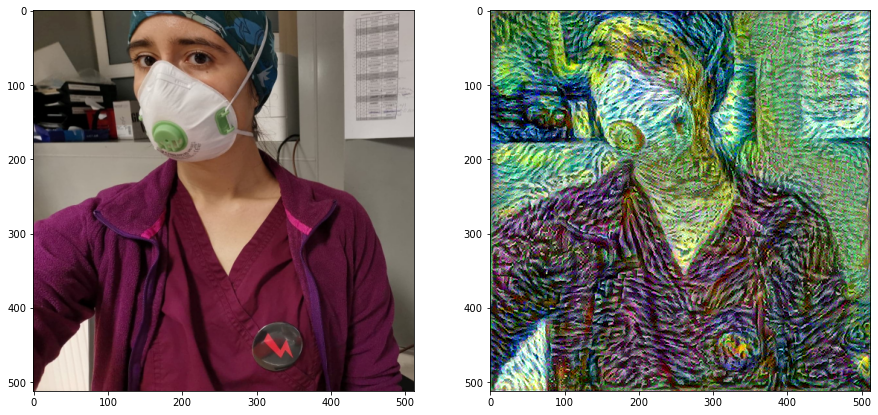

In [40]:
image_deproc = images[20][0]

plt.figure(figsize=(30,30))
plot_images([content_image,image_deproc/255])

<Figure size 2160x2160 with 0 Axes>

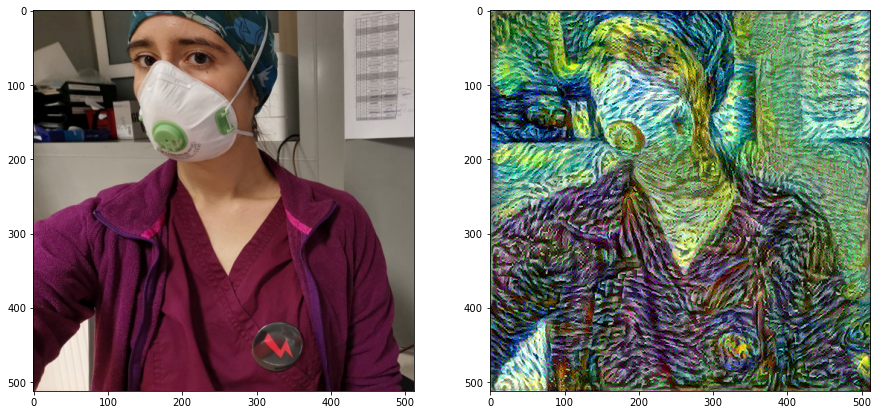

In [41]:
image_deproc = images[30][0]

plt.figure(figsize=(30,30))
plot_images([content_image,image_deproc/255])

<Figure size 2160x2160 with 0 Axes>

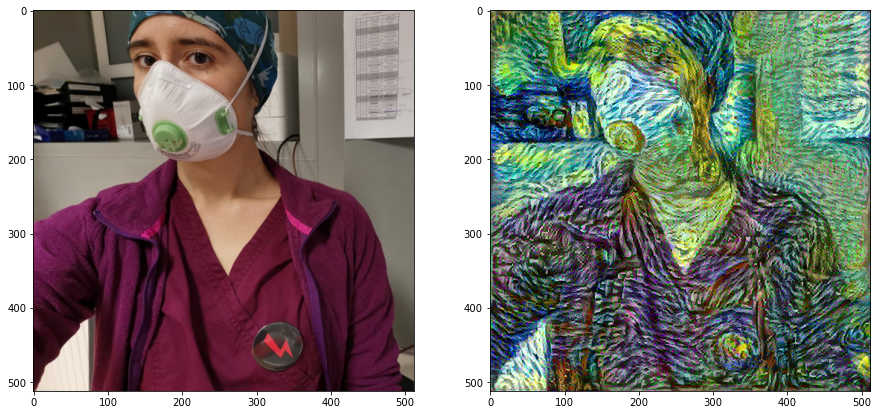

In [42]:
image_deproc = images[50][0]

plt.figure(figsize=(30,30))
plot_images([content_image,image_deproc/255])

<Figure size 2160x2160 with 0 Axes>

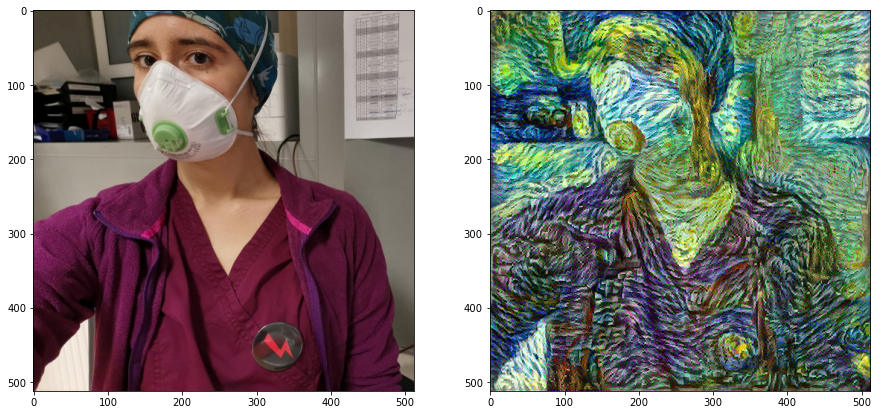

In [43]:
image_deproc = images[100][0]

plt.figure(figsize=(30,30))
plot_images([content_image,image_deproc/255])

<Figure size 2160x2160 with 0 Axes>

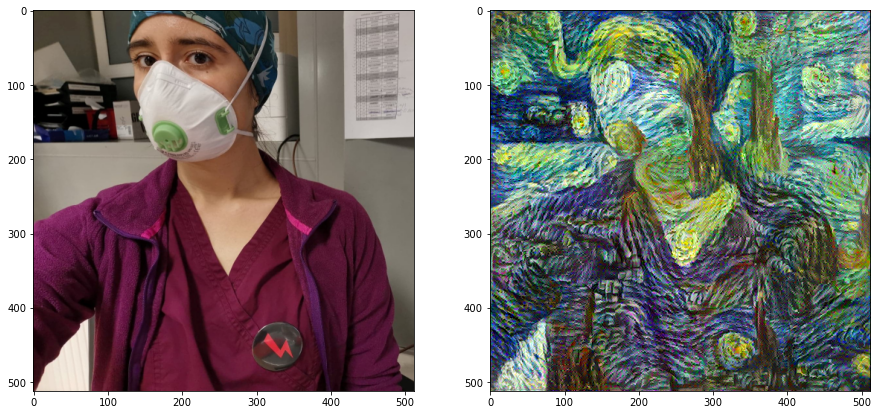

In [44]:
image_deproc = images[500][0]

plt.figure(figsize=(30,30))
plot_images([content_image,image_deproc/255])

(-0.5, 511.5, 511.5, -0.5)

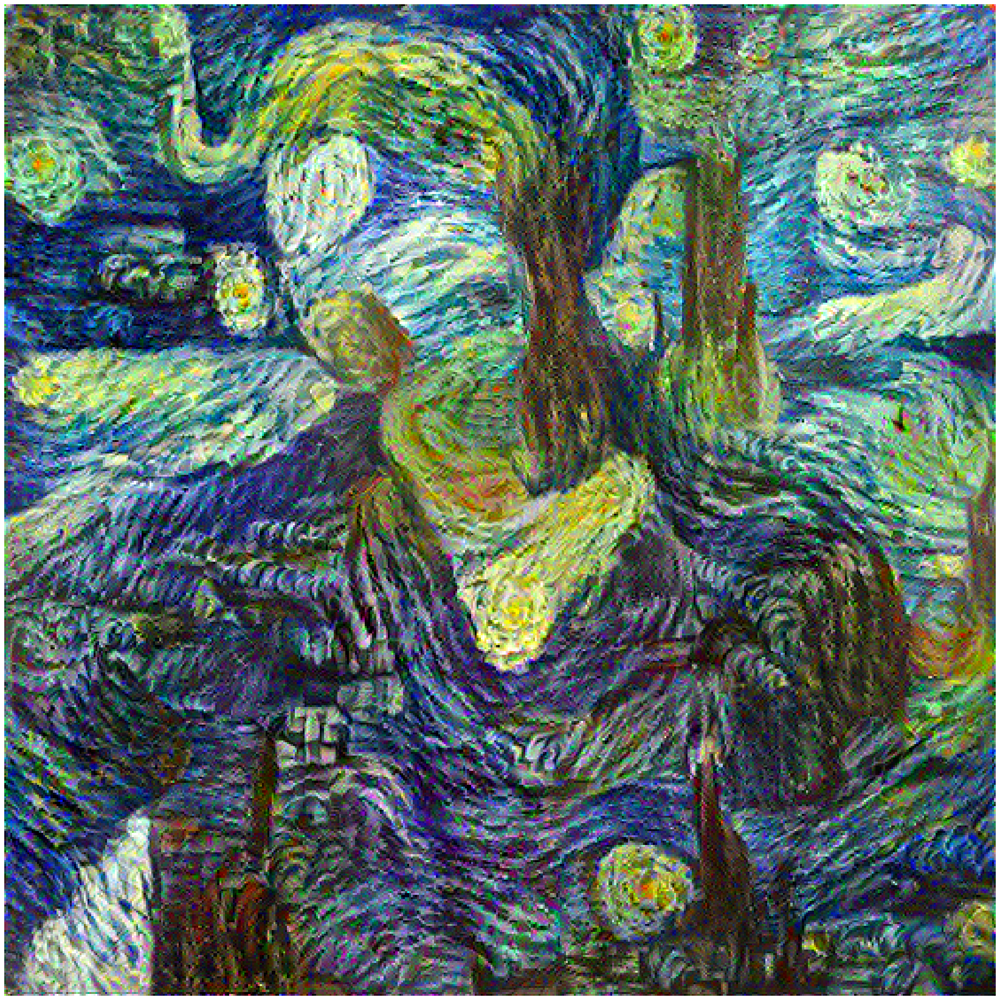

In [49]:
image_deproc = images[1000][0]

plt.figure(figsize=(30,30))
plt.imshow(image_deproc/255)
plt.axis('off')